# Introduction to the Neuronal Data

### This notebook will show these items:
- How to load the data
- what is contained in the data
 - images
 - neuronal responses
 - behavioral variables
 - anatomical coordinates of each neuron

In [1]:
cd ..

/home/maria/github/sensorium


In [2]:
import torch
import nnfabrik
from nnfabrik.builder import get_data, get_model, get_trainer
import sensorium

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from lipstick import GifMaker
from mpl_toolkits import mplot3d
%matplotlib inline

In [3]:
#filenames = ['./notebooks/data/static20457-5-9-preproc0', ]
#filenames = ['/mnt/lab/data/Neuropixels/ImageNet_25172_31_1', '/mnt/lab/data/Neuropixels/ImageNet_25172_28_1']
#filenames = ['./notebooks/data/ImageNet_25172_34_1', ]
#filenames = ['/home/maria/imagenet_data/128_22_1_1']
#filenames = ['/home/maria/imagenet_data/102_110_1_1']
filenames = ['/home/maria/imagenet_data/102_116_1_1']

dataset_fn = 'sensorium.datasets.static_loaders'
dataset_config = {'paths': filenames,
                 'normalize': True,
                 'include_behavior': False,
                 'include_eye_position': False,
                 'batch_size': 128,
                 'exclude': None,
                 'file_tree': True,
                 'scale': 1,
                 'add_behavior_as_channels':False,
                 }

dataloaders = get_data(dataset_fn, dataset_config)

/home/maria/imagenet_data/102_116_1_1 ['images', 'responses']
FileTreeDataset /home/maria/imagenet_data/102_116_1_1 (n=4258 items)
	images, responses


# Show Dataloader

In [4]:
# the neuronal data is supplied as a PyTorch DataLoader, already split into the training and validation images
# the test set is also available, containing 100 images with 10 repeats each

# the two recordings provided for both competition tracks will also have a "test" tier, but they will not contain the ground truth neuronal responses
dataloaders

OrderedDict([('train',
              OrderedDict([('102-116-1',
                            <torch.utils.data.dataloader.DataLoader at 0x7f5d5575bc40>)])),
             ('validation',
              OrderedDict([('102-116-1',
                            <torch.utils.data.dataloader.DataLoader at 0x7f5d557611f0>)])),
             ('test',
              OrderedDict([('102-116-1',
                            <torch.utils.data.dataloader.DataLoader at 0x7f5d55761280>)]))])

# Show Content of a batch

In [5]:
tier = 'train'
dataset_name = '102-116-1'

for batch in dataloaders[tier][dataset_name]:
    pass

In [6]:
# each batch is a NameTuple, containing the images, neuronal responses, and the behavioral variables
print(batch._fields)

('images', 'responses')


In [7]:
# Inspecting the content of a batch
for i, field in enumerate(batch._fields):
    print(f"{field}, {batch[i].shape}")

# what will get printed:
# images: N images, channels, height, width
# responses: N images, N neurons
# behavior: N images, N=3 behaviors (pupil size, instantaneous change of pupil size, locomotion speed)
# pupil_center: N images, N=2 eye position traces: horizontal and vertical eye position

images, torch.Size([102, 1, 144, 256])
responses, torch.Size([102, 150])


# Get all Images, Responses, and Behaviors

In [8]:
images, responses = [], []
#behaviors, eye_positions = [], []

for batch in dataloaders[tier][dataset_name]:
    images.append(batch.images.cpu().data.numpy())
    responses.append(batch.responses.squeeze().cpu().data.numpy())
    #behaviors.append(batch.behavior.squeeze().cpu().numpy())
    #eye_positions.append(batch.pupil_center.squeeze().cpu().numpy())
    
images = np.vstack(images)
responses = np.vstack(responses)
#all_behaviors = np.hstack([np.vstack(behaviors), np.vstack(eye_positions), ])

print('The \"{}\" set of dataset \"{}\" contains the responses of {} neurons to {} images'.format(tier, dataset_name, responses.shape[1], responses.shape[0]))

The "train" set of dataset "102-116-1" contains the responses of 150 neurons to 3174 images


# Recreate Plots from Fig. 2 of the Competition Proposal

### Raster Plot

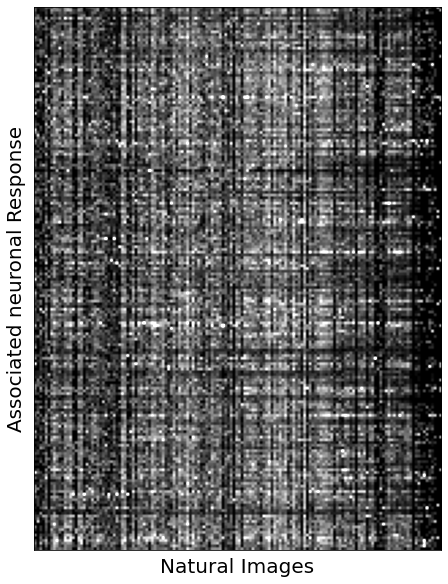

In [9]:
fig,  ax = plt.subplots(1,1, figsize=(10,10))

n_neurons = 200
n_images = 200
ax.imshow(responses[:n_images, :n_neurons], cmap="gray",vmin=0, vmax=5)

ax.set_xticks([])
ax.set_yticks([])

ax.set_xlabel("Natural Images", fontsize=20, )
ax.set_ylabel("Associated neuronal Response", fontsize=20, );

### Example Behavior Traces

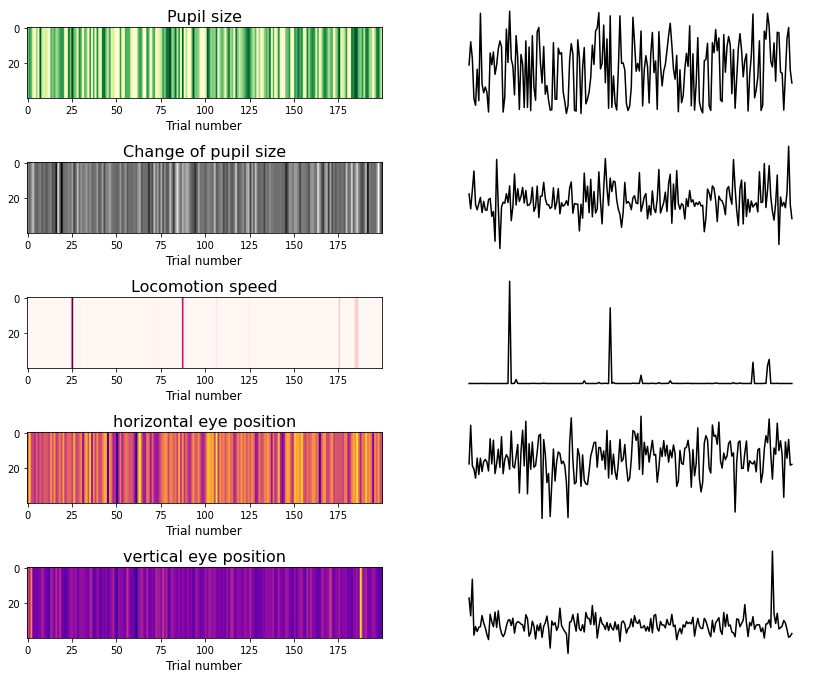

In [10]:
# 

fig, axs = plt.subplots(5,2, figsize=(14,12))

behaviors = ["Pupil size", 
            "Change of pupil size", 
            "Locomotion speed",
            "horizontal eye position",
            "vertical eye position"]
colormaps = ["YlGn", "gray", "RdPu", "plasma", "plasma"]


for i in range(2):
    for behavior in range(5):
        if i == 0:
            axs[behavior, i].imshow(np.tile(all_behaviors[:200, behavior], (40,1)), cmap=colormaps[behavior])
            axs[behavior, i].set_xlabel("Trial number", fontsize=12)
            axs[behavior, i].set_title(behaviors[behavior], fontsize=16)
        else:
            axs[behavior, i].plot(all_behaviors[:200, behavior], 'k-')
            axs[behavior, i].axis("off")
            
            

In [11]:
# Show Individual Images and the associated response of all neurons

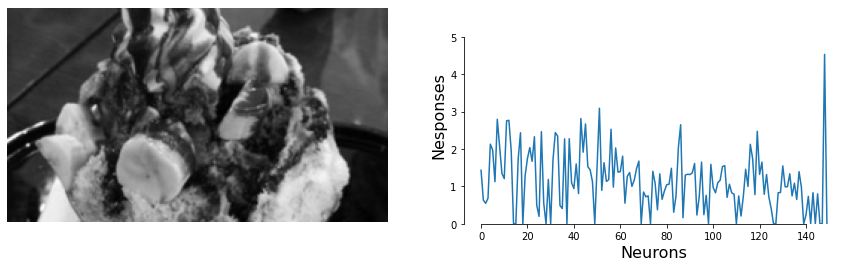

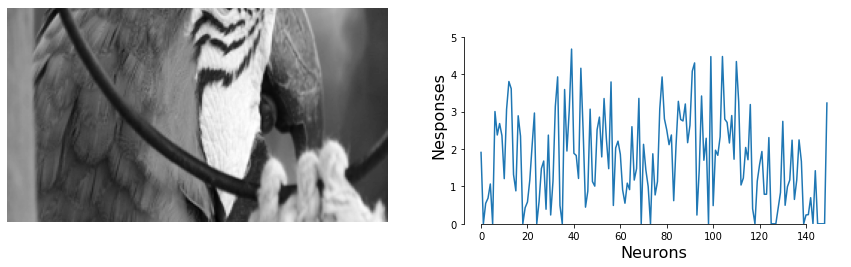

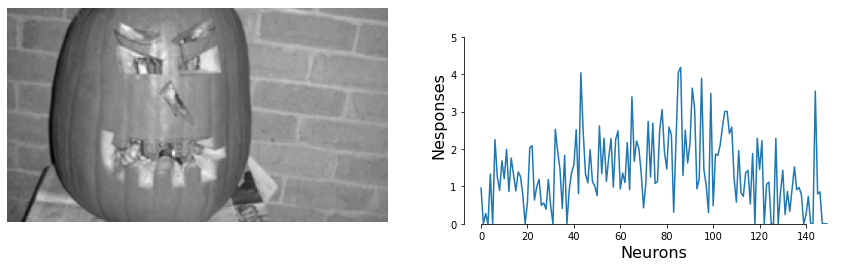

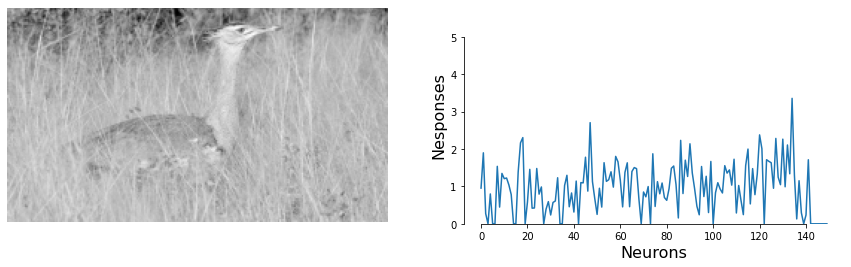

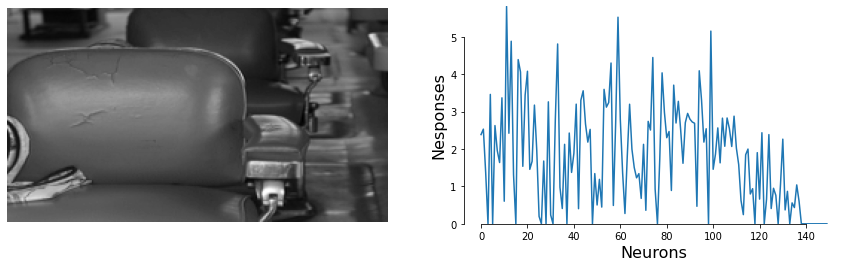

In [10]:
# show some example images and the neural responses
n_images = 5
max_response = responses[:n_images].max()

for i in range(n_images):
    fig, axs = plt.subplots(1, 2, figsize=(15,4))
    axs[0].imshow(images[i][0], cmap="gray")
    axs[0].axis("off")
    axs[1].plot(responses[i])
    axs[1].set_xlabel('Neurons', fontsize=16)
    axs[1].set_ylabel('Nesponses', fontsize=16)
    axs[1].set_ylim([0, max_response])
    sns.despine(trim=True)
    plt.show()

# Show Anatomical Coordinates of all Neurons in the recorded Volume

### compute time ~1min

IndexError: list index out of range

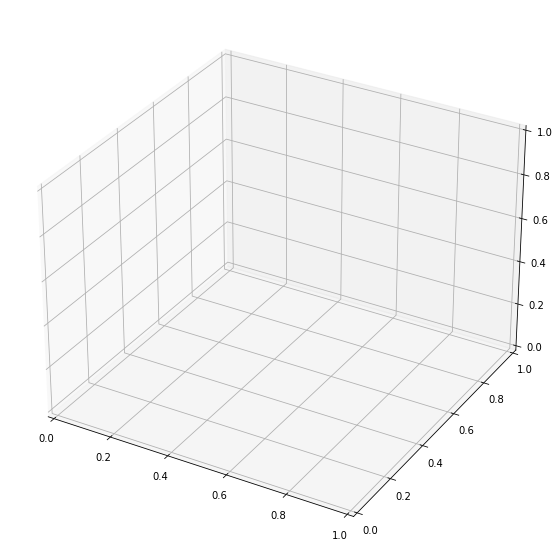

In [13]:
data_keys = list(dataloaders["train"].keys())

with GifMaker(f"scan_fields_evaluation_mice.gif", fps=24) as g:

    for trial, azimuth in enumerate(np.linspace(0, 360, 180)):
        fig = plt.figure(figsize=(10,10))
        
        for i, data_key in enumerate(data_keys):
            ax = fig.add_subplot(1, 1, i+1, projection='3d')
            cell_motor_coordinates = (dataloaders["train"][data_key].dataset.neurons.cell_motor_coordinates)
            ax.scatter3D(*cell_motor_coordinates.T, c="k", s=15, edgecolor="k", alpha=0.5, cmap="magma")
            ax.view_init(45, azimuth)
            
            # bring all coordinates on the same scale
            ax.set_zlim([100,340])
            ax.set_title(f"Anatomical positions of neurons in Recording {data_key}", fontsize=16)
            ax.set_xlabel('x coordinate', fontsize=16)
            ax.set_ylabel('y coordinate', fontsize=16)
            ax.set_zlabel('z coordinate', fontsize=16)
        g.add(fig)
g.show()

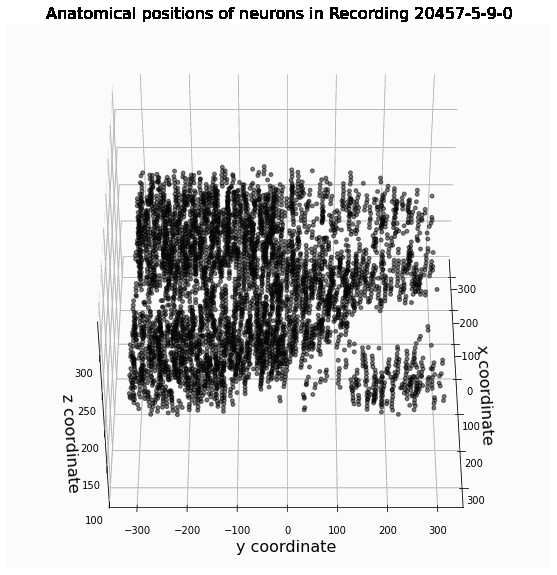

In [13]:
data_keys = list(dataloaders["train"].keys())

with GifMaker(f"scan_fields_evaluation_mice.gif", fps=24) as g:

    for trial, azimuth in enumerate(np.linspace(0, 360, 180)):
        fig = plt.figure(figsize=(10,10))
        
        for i, data_key in enumerate(data_keys):
            ax = fig.add_subplot(1, 1, i+1, projection='3d')
            cell_motor_coordinates = (dataloaders["train"][data_key].dataset.neurons.cell_motor_coordinates)
            ax.scatter3D(*cell_motor_coordinates.T, c="k", s=15, edgecolor="k", alpha=0.5, cmap="magma")
            ax.view_init(45, azimuth)
            
            # bring all coordinates on the same scale
            ax.set_zlim([100,340])
            ax.set_title(f"Anatomical positions of neurons in Recording {data_key}", fontsize=16)
            ax.set_xlabel('x coordinate', fontsize=16)
            ax.set_ylabel('y coordinate', fontsize=16)
            ax.set_zlabel('z coordinate', fontsize=16)
        g.add(fig)
g.show()